In [1]:
%matplotlib inline
from matplotlib import style
style.use('fivethirtyeight')
import matplotlib.pyplot as plt



In [2]:
import numpy as np
import pandas as pd

from datetime import datetime as dt, timedelta


from scipy import stats

# Reflect Tables into SQLAlchemy ORM

In [3]:
# Python SQL toolkit and Object Relational Mapper
import sqlalchemy
from sqlalchemy.ext.automap import automap_base
from sqlalchemy.orm import Session
from sqlalchemy import create_engine, func,inspect

In [4]:
engine = create_engine("sqlite:///hawaii.sqlite")

In [5]:
# reflect an existing database into a new model
Base = automap_base()
# reflect the tables
Base.prepare(engine, reflect= True)

In [6]:
# We can view all of the classes that automap found
Base.classes.keys()

['measurement', 'station']

In [7]:
# Save references to each table
Measurement = Base.classes.measurement
Station = Base.classes.station

In [8]:
# Create our session (link) from Python to the DB
session = Session(engine)

In [9]:
# inspect the table and data types
inspector = inspect(engine)


In [10]:
#check columns and data types for measurement
columns_m = inspector.get_columns('measurement')
for column in columns_m:
    print(column["name"], column["type"])

id INTEGER
station TEXT
date TEXT
prcp FLOAT
tobs FLOAT


In [11]:
#check columns and data types for station
columns_s = inspector.get_columns('station')
for column in columns_s:
    print(column["name"], column["type"])

id INTEGER
station TEXT
name TEXT
latitude FLOAT
longitude FLOAT
elevation FLOAT


# Exploratory Climate Analysis

In [12]:
# Design a query to retrieve the last 12 months of precipitation data and plot the results

#find the most recent date of measurement
last_date = session.query(Measurement.date).order_by(Measurement.date.desc()).first()
last_date






('2017-08-23')

In [13]:
# Calculate the date 1 year ago from the last data point in the database
last_date_dt = dt.strptime(last_date[0], '%Y-%m-%d').date()

date_year_ago = last_date_dt - timedelta(days=365)

print (date_year_ago)

2016-08-23


In [14]:
# Perform a query to retrieve the data and precipitation scores for last 12 months
precip_records = session.query(Measurement.date, Measurement.prcp).\
    filter(Measurement.date >=date_year_ago).all()

for row in precip_records:
    x = list(np.ravel(precip_records))
    print (x)

['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13

['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['2016-08-23', 0.0, '2016-08-24', 0.08, '2016-08-25', 0.08, '2016-08-26', 0.0, '2016-08-27', 0.0, '2016-08-28', 0.01, '2016-08-29', 0.0, '2016-08-30', 0.0, '2016-08-31', 0.13, '2016-09-01', 0.0, '2016-09-02', 0.0, '2016-09-03', 0.0, '2016-09-04', 0.03, '2016-09-05', None, '2016-09-06', None, '2016-09-07', 0.05, '2016-09-08', 0.0, '2016-09-09', 0.03, '2016-09-10', 0.0, '2016-09-11', 0.05, '2016-09-12', 0.0, '2016-09-13', 0.02, '2016-09-14', 1.32, '2016-09-15', 0.42, '2016-09-16', 0.06, '2016-09-17', 0.05, '2016-09-18', 0.0, '2016-09-19', 0.0, '2016-09-20', 0.0, '2016-09-21', 0.0, '2016-09-22', 0.02, '2016-09-23', 0.0, '2016-09-24', 0.0, '2016-09-25', 0.0, '2016-09-26', 0.06, '2016-09-27', 0.02, '2016-09-28', 0.0, '2016-09-29', 0.0, '2016-09-30', 0.0, '2016-10-01', 0.0, '2016-10-02', 0.0, '2016-10-03', 0.0, '2016-10-04', 0.0, '2016-10-05', 0.0, '2016-10-06', 0.0, '2016-10-07', 0.0, '2016-10-08', 0.0, '2016-10-09', 0.0, '2016-10-10', 0.0, '2016-10-11', 0.0, '2016-10-12', 0.0, '2016-10-13'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [15]:
# Save the query results as a Pandas DataFrame and set the index to the date column
precip_df = pd.DataFrame(precip_records)

precip_df.set_index("date", inplace = True)
precip_df

,prcp
date,
2016-08-23,0.00
2016-08-24,0.08
2016-08-25,0.08
2016-08-26,0.00
2016-08-27,0.00
...,...
2017-08-19,0.09
2017-08-20,NaN
2017-08-21,0.56


In [16]:
# Sort the dataframe by date
precip_df.sort_values(["date"])
precip_df.head()

,prcp
date,
2016-08-23,0.00
2016-08-24,0.08
2016-08-25,0.08
2016-08-26,0.00
2016-08-27,0.00


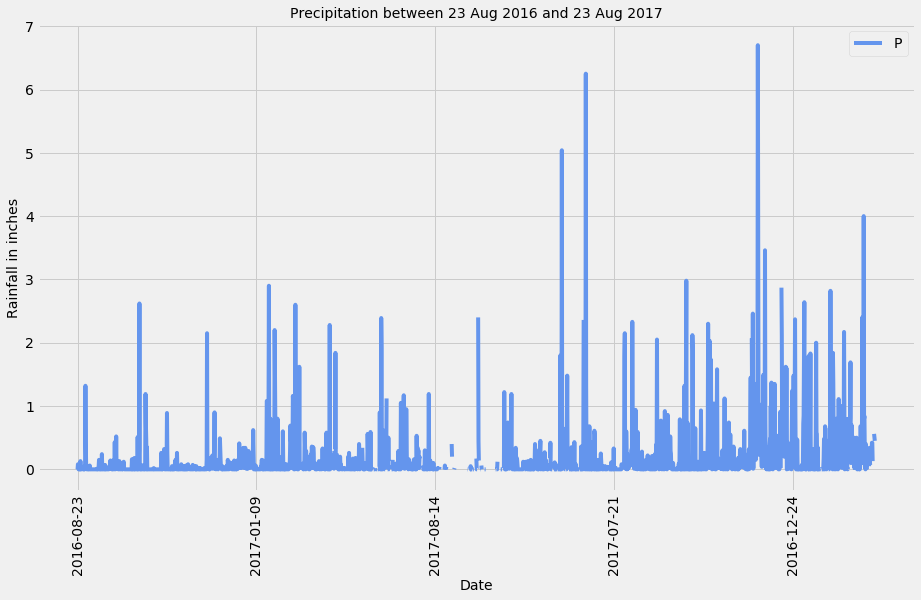

In [17]:
# Use Pandas Plotting with Matplotlib to plot the data
precip_df.plot(figsize=(14,8), color = "cornflowerblue", rot= 90)
# set labels and title
plt.title("Precipitation between 23 Aug 2016 and 23 Aug 2017", fontsize = 14)
plt.ylabel("Rainfall in inches", fontsize = 14)
plt.xlabel("Date", fontsize = 14)
plt.legend("Prcp")
plt.show
plt.savefig("Precip_analysis.PNG")

In [18]:
# Use Pandas to calcualte the summary statistics for the precipitation data
precip_df.describe()

,prcp
count,2021.000000
mean,0.177279
std,0.461190
min,0.000000
25%,0.000000
50%,0.020000
75%,0.130000
max,6.700000


# Station Analysis


In [19]:
# Design a query to show how many stations are available in this dataset?
count = session.query(Measurement.station).distinct().count()
count

9

In [20]:
# What are the most active stations? (i.e. what stations have the most rows)?
# List the stations and the counts in descending order.
busy_stations = session.query(Measurement.station, func.count(Measurement.station), Station.name).\
                             filter(Station.station == Measurement.station).\
                             group_by(Measurement.station).\
                             order_by(func.count(Measurement.station).desc()).all()

busy_stations

[('USC00519281', 2772, 'WAIHEE 837.5, HI US'),
 ('USC00519397', 2724, 'WAIKIKI 717.2, HI US'),
 ('USC00513117', 2709, 'KANEOHE 838.1, HI US'),
 ('USC00519523', 2669, 'WAIMANALO EXPERIMENTAL FARM, HI US'),
 ('USC00516128', 2612, 'MANOA LYON ARBO 785.2, HI US'),
 ('USC00514830', 2202, 'KUALOA RANCH HEADQUARTERS 886.9, HI US'),
 ('USC00511918', 1979, 'HONOLULU OBSERVATORY 702.2, HI US'),
 ('USC00517948', 1372, 'PEARL CITY, HI US'),
 ('USC00518838', 511, 'UPPER WAHIAWA 874.3, HI US')]

In [21]:
# Using the station id from the previous query, calculate the lowest temperature recorded, 
# highest temperature recorded, and average temperature of the most active station?
station_temp = session.query(func.min(Measurement.tobs), func.max(Measurement.tobs), func.avg(Measurement.tobs)).\
               filter(Measurement.station == 'USC00519281' ).all()
station_temp

[(54.0, 85.0, 71.66378066378067)]

In [22]:
# Choose the station with the highest number of temperature observations.
# Query the last 12 months of temperature observation data for this station and plot the results as a histogram
one_year_temp = session.query(Measurement.tobs).\
               filter(Measurement.station == 'USC00519281' ).\
               filter(Measurement.date >= date_year_ago).all()
one_year_temp

[(77.0),
 (77.0),
 (80.0),
 (80.0),
 (75.0),
 (73.0),
 (78.0),
 (77.0),
 (78.0),
 (80.0),
 (80.0),
 (78.0),
 (78.0),
 (78.0),
 (73.0),
 (74.0),
 (80.0),
 (79.0),
 (77.0),
 (80.0),
 (76.0),
 (79.0),
 (75.0),
 (79.0),
 (78.0),
 (79.0),
 (78.0),
 (78.0),
 (76.0),
 (74.0),
 (77.0),
 (78.0),
 (79.0),
 (79.0),
 (77.0),
 (80.0),
 (78.0),
 (78.0),
 (78.0),
 (77.0),
 (79.0),
 (79.0),
 (79.0),
 (79.0),
 (75.0),
 (76.0),
 (73.0),
 (72.0),
 (71.0),
 (77.0),
 (79.0),
 (78.0),
 (79.0),
 (77.0),
 (79.0),
 (77.0),
 (78.0),
 (78.0),
 (78.0),
 (78.0),
 (77.0),
 (74.0),
 (75.0),
 (76.0),
 (73.0),
 (76.0),
 (74.0),
 (77.0),
 (76.0),
 (76.0),
 (74.0),
 (75.0),
 (75.0),
 (75.0),
 (75.0),
 (71.0),
 (63.0),
 (70.0),
 (68.0),
 (67.0),
 (77.0),
 (74.0),
 (77.0),
 (76.0),
 (76.0),
 (75.0),
 (76.0),
 (75.0),
 (73.0),
 (75.0),
 (73.0),
 (75.0),
 (74.0),
 (75.0),
 (74.0),
 (75.0),
 (73.0),
 (75.0),
 (73.0),
 (73.0),
 (74.0),
 (70.0),
 (72.0),
 (70.0),
 (67.0),
 (67.0),
 (69.0),
 (70.0),
 (68.0),
 (69.0),
 (69.0),
 

In [23]:
temp_df = pd.DataFrame(one_year_temp, columns = ["Observed Temperature"])
temp_df.head()

,Observed Temperature
0,77.0
1,77.0
2,80.0
3,80.0
4,75.0


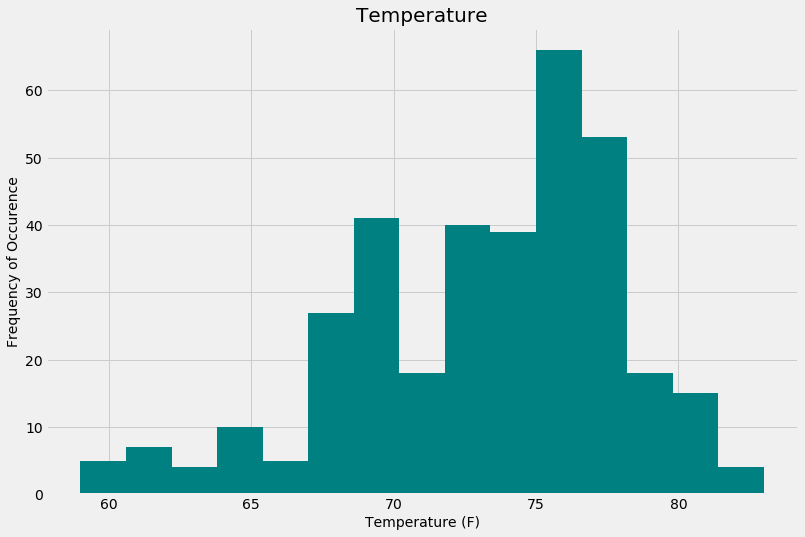

In [24]:
fig1, ax1 = plt.subplots(figsize=(12,8))
plt.hist(temp_df["Observed Temperature"], 15, density = False, color = "teal", label="Temperature")
plt.xlabel("Temperature (F)", fontsize = 14)
plt.ylabel("Frequency of Occurence", fontsize = 14)
plt.title ("Temperature", fontsize = 20)
plt.show
plt.savefig("Temp_Histogram.png")

## Bonus Challenge Assignment

## Temperature Analysis I


Hawaii is reputed to enjoy mild weather all year. Is there a meaningful difference between the temperature in, for example, June and December?


You may either use SQLAlchemy or pandas's read_csv() to perform this portion.


Identify the average temperature in June at all stations across all available years in the dataset. Do the same for December temperature.


Use the t-test to determine whether the difference in the means, if any, is statistically significant. Will you use a paired t-test, or an unpaired t-test? Why?

In [25]:
# Calculate June averages for all stations


average_June = session.query(func.avg(Measurement.tobs)).group_by(Measurement.station).\
               filter(func.strftime("%m", Measurement.date) == "06").\
               order_by(func.avg(Measurement.tobs).desc()).all()
average_June

[(77.55932203389831),
 (76.66810344827586),
 (76.6554054054054),
 (76.00537634408602),
 (74.13939393939394),
 (74.05084745762711),
 (73.39473684210526),
 (73.27118644067797),
 (71.9372197309417)]

In [26]:
#Calculate December averages for all stations
average_Dec = session.query(func.avg(Measurement.tobs)).group_by(Measurement.station).\
               filter(func.strftime("%m", Measurement.date) == "12").\
               order_by(func.avg(Measurement.tobs).desc()).all()
average_Dec

[(73.2247191011236),
 (72.43333333333334),
 (72.42105263157895),
 (71.8348623853211),
 (71.10952380952381),
 (71.06944444444444),
 (69.90322580645162),
 (69.6842105263158),
 (69.29126213592232)]

In [27]:
#Comparing temperatures between June and December
# Unpaired (independent) t-test

stats.ttest_ind(average_June, average_Dec)


Ttest_indResult(statistic=array([4.61586542]), pvalue=array([0.00028626]))

Use of an unpaired t-test is appropriate in this case, as the compasrison is between the means of two independent groups. Given the very low p-value(i.e.) significantly lower than 0.05, we can conclude that there is no statistically significant difference in the June and December temperatures in Hawaii. 

In [28]:
# This function called `calc_temps` will accept start date and end date in the format '%Y-%m-%d' 
# and return the minimum, average, and maximum temperatures for that range of dates
def calc_temps(start_date, end_date):
    """TMIN, TAVG, and TMAX for a list of dates.
    
    Args:
        start_date (string): A date string in the format %Y-%m-%d
        end_date (string): A date string in the format %Y-%m-%d
        
    Returns:
        TMIN, TAVE, and TMAX
    """
    
    return session.query(func.min(Measurement.tobs), func.avg(Measurement.tobs), func.max(Measurement.tobs)).\
        filter(Measurement.date >= start_date).filter(Measurement.date <= end_date).all()

# function usage example
print(calc_temps('2012-02-28', '2012-03-05'))

[(62.0, 69.57142857142857, 74.0)]


In [29]:
# Use your previous function `calc_temps` to calculate the tmin, tavg, and tmax 
# for your trip using the previous year's data for those same dates.

print("Temperature analysis for vacation 07/01/17 to 07/10/2017")
    
def calc_temps(start_date, end_date):
    """TMIN, TAVG, and TMAX for a list of dates.
    
    Args:
        start_date (string): "A date string in the format" %Y-%m-%d
        end_date (string): A date string in the format %Y-%m-%d
        
    Returns:
        TMIN, TAVE, and TMAX
    """
    
    return session.query(func.min(Measurement.tobs), func.avg(Measurement.tobs), func.max(Measurement.tobs)).\
        filter(Measurement.date >= start_date).filter(Measurement.date <= end_date).all()

# function usage example (choosing same dates, one year prior to July 2017)
results = (calc_temps('2016-07-01', '2017-07-10'))

results_list = list(np.ravel(results))
results_list

Temperature analysis for vacation 07/01/17 to 07/10/2017


[58.0, 74.63823403343335, 87.0]

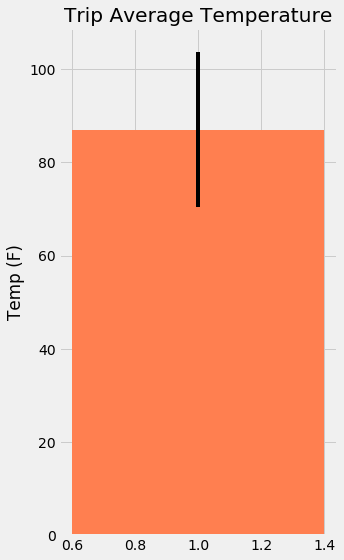

In [30]:
# Plot the results from your previous query as a bar chart. 
# Use "Trip Avg Temp" as your Title
# Use the average temperature for the y value
# Use the peak-to-peak (tmax-tmin) value as the y error bar (yerr)

t_min = (results_list)[0]
t_max = (results_list)[1]
t_avg = (results_list)[2]

fig1, ax1 = plt.subplots(figsize = (5,8))

y= t_avg
ax1.bar(1, t_avg, yerr = (t_max - t_min), color = "coral")
ax1.set_title("Trip Average Temperature")
plt.ylabel("Temp (F)")
fig1.tight_layout()
plt.show()
plt.savefig("Trip_Average_Temp.png", bbox_inches='tight')


In [31]:
# Calculate the total amount of rainfall per weather station for your trip dates using the previous year's matching dates.
# Sort this in descending order by precipitation amount and list the station, name, latitude, longitude, and elevation
vacay_start_date = "2016-07-01"
vacay_end_date = "2016-07-10"


sel = [Station.station, Station.name, Station.latitude, Station.longitude, Station.elevation]
results_rainfall = session.query(*sel).\
    filter(Station.station == Measurement.station).\
    filter(Measurement.date >= vacay_start_date).\
    filter(Measurement.date <= vacay_end_date).\
    group_by(Measurement.station).\
    order_by(func.sum(Measurement.prcp).desc()).all()
results_rainfall_df = pd.DataFrame(results_rainfall)
results_rainfall_df


,station,name,latitude,longitude,elevation
0,USC00516128,"MANOA LYON ARBO 785.2, HI US",21.33310,-157.80250,152.4
1,USC00519281,"WAIHEE 837.5, HI US",21.45167,-157.84889,32.9
2,USC00513117,"KANEOHE 838.1, HI US",21.42340,-157.80150,14.6
3,USC00519523,"WAIMANALO EXPERIMENTAL FARM, HI US",21.33556,-157.71139,19.5
4,USC00514830,"KUALOA RANCH HEADQUARTERS 886.9, HI US",21.52130,-157.83740,7.0
5,USC00519397,"WAIKIKI 717.2, HI US",21.27160,-157.81680,3.0
6,USC00517948,"PEARL CITY, HI US",21.39340,-157.97510,11.9


In [32]:
# Create a query that will calculate the daily normals 
# (i.e. the averages for tmin, tmax, and tavg for all historic data matching a specific month and day)

def daily_normals(date):
    """Daily Normals.
    
    Args:
        date (str): A date string in the format '%m-%d'
        
    Returns:
        A list of tuples containing the daily normals, tmin, tavg, and tmax
    
    """
    
    sel = [func.min(Measurement.tobs), func.avg(Measurement.tobs), func.max(Measurement.tobs)]
    return session.query(*sel).filter(func.strftime("%m-%d", Measurement.date) == date).all()
    
daily_normals("01-01")

[(62.0, 69.15384615384616, 77.0)]

In [42]:
# calculate the daily normals for your trip
# push each tuple of calculations into a list called `normals`

# Set the start and end date of the trip
vacay_start_date = "2016-07-01"
vacay_end_date = "2016-07-10"

# Use the start and end date to create a range of dates
vacay_dates = ["2016-07-01", "2016-07-02", "2016-07-03", "2016-07-04", "2016-07-05", "2016-07-06", "2016-07-07", "2016-07-08",
              "2016-07-09", "2016-07-10"]
#convert string to datetime format
date_list =[dt.strptime(date, "%Y-%m-%d") for date in vacay_dates]


# Stip off the year and save a list of %m-%d strings
vacay_date_list = [date.strftime("%m-%d") for date in date_list]
vacay_date_list


['07-01',
 '07-02',
 '07-03',
 '07-04',
 '07-05',
 '07-06',
 '07-07',
 '07-08',
 '07-09',
 '07-10']

In [49]:
# Loop through the list of %m-%d strings and calculate the normals for each date
normals = []

for day in vacay_date_list:
    normals.append(daily_normals(day)[0])
    
print(normals)

[(67.0, 74.77777777777777, 81.0), (68.0, 75.40384615384616, 82.0), (68.0, 75.32075471698113, 87.0), (70.0, 76.57142857142857, 81.0), (66.0, 75.0, 81.0), (69.0, 75.0, 81.0), (69.0, 74.91071428571429, 82.0), (69.0, 76.08333333333333, 83.0), (68.0, 76.19298245614036, 83.0), (68.0, 75.62068965517241, 82.0)]


In [54]:
# Load the previous query results into a Pandas DataFrame and add the `trip_dates` range as the `date` index

daily_normals_df = pd.DataFrame(normals, columns = ["Min Temp", "Average Temp", "Max Temp"])
daily_normals_df["Dates"] = vacay_dates
daily_normals_date_df = daily_normals_df.set_index("Dates")
daily_normals_date_df

,Min Temp,Average Temp,Max Temp
Dates,,,
2016-07-01,67.0,74.777778,81.0
2016-07-02,68.0,75.403846,82.0
2016-07-03,68.0,75.320755,87.0
2016-07-04,70.0,76.571429,81.0
2016-07-05,66.0,75.000000,81.0
2016-07-06,69.0,75.000000,81.0
2016-07-07,69.0,74.910714,82.0
2016-07-08,69.0,76.083333,83.0
2016-07-09,68.0,76.192982,83.0


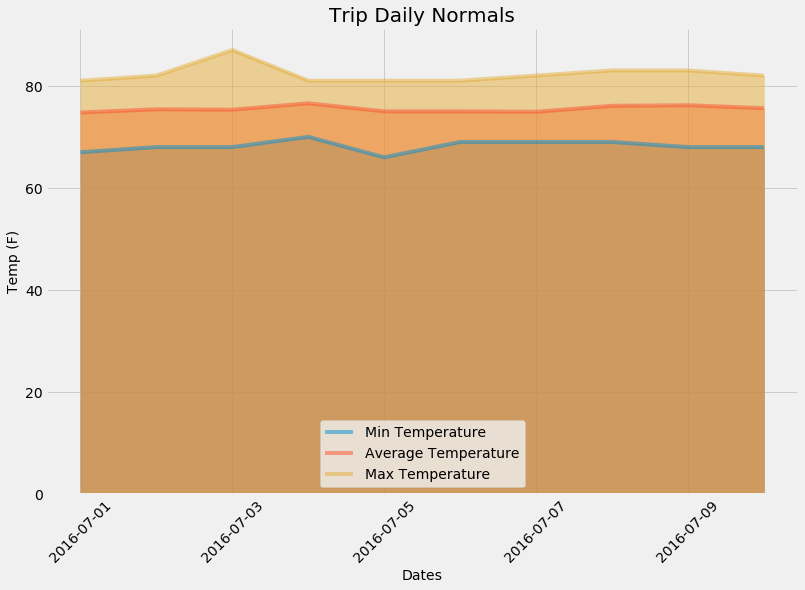

In [64]:
# Plot the daily normals as an area plot with `stacked=False`

daily_normals_date_df.plot.area(stacked=False, figsize = (12, 8))
plt.title("Trip Daily Normals", fontsize = 20)
plt.ylabel("Temp (F)", fontsize = 14)
plt.legend(('Min Temperature', 'Average Temperature', 'Max Temperature'),loc='lower center')
plt.xlabel("Dates", fontsize = 14)
plt.xticks(rotation=45)
plt.show
plt.savefig("Daily_Normals.png", bbox_inches='tight')